# Data Cleaning And Preprocessing

In [1]:
#import libraries

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import preprocessing
from datetime import datetime, date, timedelta
import seaborn as sns
import plotly.express as px
from sklearn import preprocessing
import pygwalker as pyg


# Ignore all warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore', category=DeprecationWarning)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
np.random.seed(42)

In [3]:
marketing_data = pd.read_csv('marketing_campaign.csv')

In [4]:
marketing_data.shape

(2240, 29)

In [5]:
marketing_data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
5,7446,1967,Master,Together,62513.0,0,1,2013-09-09,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,3,11,0
6,965,1971,Graduation,Divorced,55635.0,0,1,2012-11-13,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,3,11,0
7,6177,1985,PhD,Married,33454.0,1,0,2013-05-08,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,3,11,0
8,4855,1974,PhD,Together,30351.0,1,0,2013-06-06,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1
9,5899,1950,PhD,Together,5648.0,1,1,2014-03-13,68,28,0,6,1,1,13,1,1,0,0,20,1,0,0,0,0,0,3,11,0


In [6]:
#statistics for numerical columns
marketing_data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [7]:
marketing_data.dtypes

ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object

### Check Null Values

In [8]:
marketing_data.isnull().values.any()

True

In [9]:
marketing_data.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [10]:
mean_income = marketing_data['Income'].mean()
print("%.2f" % mean_income)

52247.25


In [11]:
marketing_data['Income'].fillna(value=mean_income, inplace=True)
marketing_data.isnull().values.any()

False

### Remove Unwanted Columns 

In [12]:
print("Values in Z_CostContact = ", marketing_data['Z_CostContact'].unique())
print("Values in Z_Revenue = ", marketing_data['Z_Revenue'].unique())

Values in Z_CostContact =  [3]
Values in Z_Revenue =  [11]


In [13]:
remove_cols= ['Z_CostContact','Z_Revenue']
marketing_data = marketing_data.drop(remove_cols,axis=1)

In [14]:
len(marketing_data.columns)

27

### Alter Data Values

In [15]:
marketing_data.describe(include = ['O']) # List out object columns

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,2012-08-31
freq,1127,864,12


In [16]:
# Marital Status

In [17]:
marketing_data['Marital_Status'].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [18]:
marketing_data['Marital_Status'] = marketing_data['Marital_Status'].replace(['Together', 'Married'],'Couple')
marketing_data['Marital_Status'] = marketing_data['Marital_Status'].replace(['Divorced', 'Widow', 'Alone'],'Single')
marketing_data['Marital_Status'] = marketing_data['Marital_Status'].replace(['Absurd', 'YOLO'],'Unspecified')

In [19]:
marketing_data['Marital_Status'].unique()

array(['Single', 'Couple', 'Unspecified'], dtype=object)

In [20]:
# Education

In [21]:
marketing_data['Education'].unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

In [22]:
marketing_data['Education'] = marketing_data['Education'].replace(['Graduation','Basic', '2n Cycle'],['Graduate','High School','Unspecified'])
marketing_data['Education'] = marketing_data['Education'].replace(['PhD','Master'],'Post-Graduate')

In [23]:
marketing_data['Education'].unique()

array(['Graduate', 'Post-Graduate', 'High School', 'Unspecified'],
      dtype=object)

### Alter Data Types

In [24]:
# Year Birth

In [25]:
print("Current Year_Birth Format = ", marketing_data['Year_Birth'].dtypes)
marketing_data['Year_Birth'] = pd.to_datetime(marketing_data['Year_Birth'], format='%Y')
print("Altered Year_Birth Format = ",marketing_data['Year_Birth'].dtypes)

Current Year_Birth Format =  int64
Altered Year_Birth Format =  datetime64[ns]


In [26]:
# Joined Date

In [27]:
print("Current Dt_Customer Format = ", marketing_data['Dt_Customer'].dtypes)
marketing_data['Dt_Customer'] = pd.to_datetime(marketing_data['Dt_Customer'], format='%Y-%m-%d')
print("Altered Dt_Customer Format = ", marketing_data['Dt_Customer'].dtypes)

Current Dt_Customer Format =  object
Altered Dt_Customer Format =  datetime64[ns]


In [28]:
# Currency Values to Float

In [29]:
marketing_data['MntWines'] = marketing_data['MntWines'].astype(float)
marketing_data['MntFruits'] = marketing_data['MntFruits'].astype(float)
marketing_data['MntMeatProducts'] = marketing_data['MntMeatProducts'].astype(float)
marketing_data['MntFishProducts'] = marketing_data['MntFishProducts'].astype(float)
marketing_data['MntSweetProducts'] = marketing_data['MntSweetProducts'].astype(float)
marketing_data['MntGoldProds'] = marketing_data['MntGoldProds'].astype(float)

In [30]:
marketing_data.dtypes

ID                              int64
Year_Birth             datetime64[ns]
Education                      object
Marital_Status                 object
Income                        float64
Kidhome                         int64
Teenhome                        int64
Dt_Customer            datetime64[ns]
Recency                         int64
MntWines                      float64
MntFruits                     float64
MntMeatProducts               float64
MntFishProducts               float64
MntSweetProducts              float64
MntGoldProds                  float64
NumDealsPurchases               int64
NumWebPurchases                 int64
NumCatalogPurchases             int64
NumStorePurchases               int64
NumWebVisitsMonth               int64
AcceptedCmp3                    int64
AcceptedCmp4                    int64
AcceptedCmp5                    int64
AcceptedCmp1                    int64
AcceptedCmp2                    int64
Complain                        int64
Response    

# Feature Engineering

In [31]:
print("Number of Total Rows: ",marketing_data['ID'].count())
print("Number of Unique IDs: ",marketing_data['ID'].nunique())

Number of Total Rows:  2240
Number of Unique IDs:  2240


### Age

In [32]:
#function to calculate age
def calculateAge(birthDate):
    today = date.today()
    age = today.year - birthDate.year - ((today.month, today.day) < (birthDate.month, birthDate.day)) 
    return age

#apply function to all rows
marketing_data['Year_Birth'] = marketing_data['Year_Birth'].apply(calculateAge)

In [33]:
marketing_data.rename(columns = {'Year_Birth':'Age'}, inplace = True)
print(marketing_data['Age'].head())

0    66
1    69
2    58
3    39
4    42
Name: Age, dtype: int64


### Overall Acceptance Rate

In [34]:
marketing_data['Overall_Acceptance_Rate'] = marketing_data['AcceptedCmp1'] + marketing_data['AcceptedCmp2'] + marketing_data['AcceptedCmp3'] + marketing_data['AcceptedCmp4'] + marketing_data['AcceptedCmp5']
print(marketing_data['Overall_Acceptance_Rate'].unique())

[0 1 2 3 4]


### Membership duration

In [35]:
marketing_data['Membership_Duration'] = marketing_data['Dt_Customer'].apply(calculateAge)
print(marketing_data['Dt_Customer'].max())
print(marketing_data['Dt_Customer'].min())

2014-06-29 00:00:00
2012-07-30 00:00:00


### Total Amount Spent

In [36]:
marketing_data['Total_Amt_Spent'] = marketing_data['MntWines'] + marketing_data['MntFruits'] + marketing_data['MntMeatProducts'] + marketing_data['MntFishProducts'] + marketing_data['MntSweetProducts'] + marketing_data['MntGoldProds']
print(marketing_data['Total_Amt_Spent'].head())

0    1617.0
1      27.0
2     776.0
3      53.0
4     422.0
Name: Total_Amt_Spent, dtype: float64


### Total People In The Household

In [37]:
total_count = []

for status in marketing_data['Marital_Status']:
    
    adults = 0

    if status == 'Couple':
        adults = total_count.append(2)  
    else:
        adults = total_count.append(1)  
 

In [38]:
marketing_data['Total_People'] = total_count + marketing_data['Kidhome'] + marketing_data['Teenhome']
print(marketing_data['Total_People'].head())

0    1
1    3
2    2
3    3
4    3
Name: Total_People, dtype: int64


### Outlier Detection

In [39]:
cols = ['Age','Income','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Total_Amt_Spent']

for chosen_col in cols:
    
    fig = px.box(marketing_data, x= chosen_col)    
    fig.update_layout(
    width=1000,
    height=300 
    )
    fig.show()

In [40]:
mode_age = marketing_data['Age'].mode()
mean_income = marketing_data['Income'].mean()

marketing_data['Age'] = np.where(marketing_data['Age'] >83, mode_age ,marketing_data['Age'])
marketing_data['Income'] = marketing_data['Income'].replace([666666.00], mean_income)

print(mean_income)

52247.25135379059


In [41]:
cols = ['Age','Income']

for chosen_col in cols:
    
    fig = px.box(marketing_data, x= chosen_col)    
    fig.update_layout(
    width=1000,
    height=300 
    )
    fig.show()

### Encoding

In [42]:
unencoded_cols = ['Education','Marital_Status']
le = preprocessing.LabelEncoder()
enc_marketing_data = marketing_data.copy()

for col in unencoded_cols:
    enc_marketing_data[col] = le.fit_transform(marketing_data[col])
    
enc_marketing_data.head()

,ID,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Overall_Acceptance_Rate,Membership_Duration,Total_Amt_Spent,Total_People
0,5524,66,0,1,58138.0,0,0,2012-09-04,58,635.0,88.0,546.0,172.0,88.0,88.0,3,8,10,4,7,0,0,0,0,0,0,1,0,10,1617.0,1
1,2174,69,0,1,46344.0,1,1,2014-03-08,38,11.0,1.0,6.0,2.0,1.0,6.0,2,1,1,2,5,0,0,0,0,0,0,0,0,9,27.0,3
2,4141,58,0,0,71613.0,0,0,2013-08-21,26,426.0,49.0,127.0,111.0,21.0,42.0,1,8,2,10,4,0,0,0,0,0,0,0,0,9,776.0,2
3,6182,39,0,0,26646.0,1,0,2014-02-10,26,11.0,4.0,20.0,10.0,3.0,5.0,2,2,0,4,6,0,0,0,0,0,0,0,0,9,53.0,3
4,5324,42,2,0,58293.0,1,0,2014-01-19,94,173.0,43.0,118.0,46.0,27.0,15.0,5,5,3,6,5,0,0,0,0,0,0,0,0,9,422.0,3


### Log Transformation

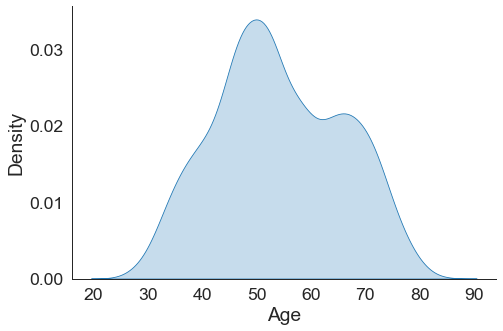

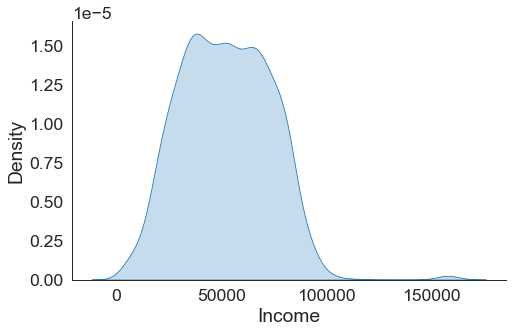

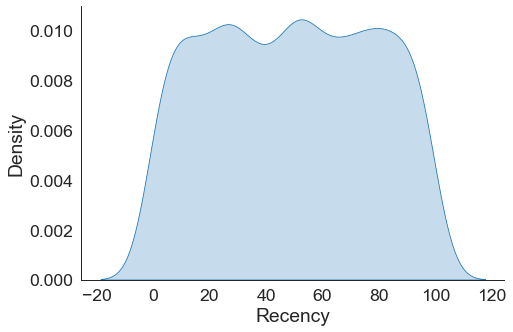

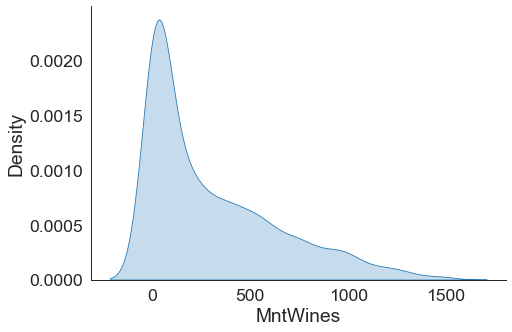

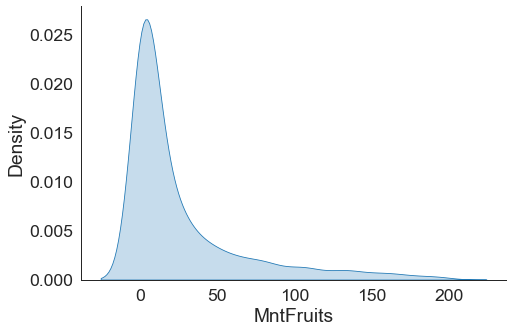

...

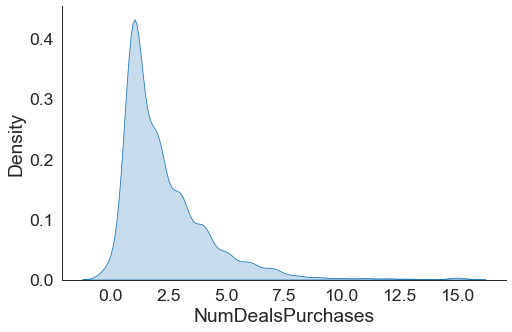

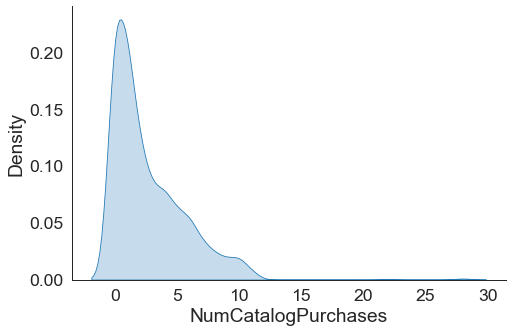

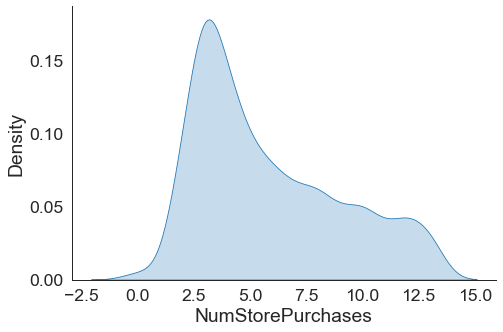

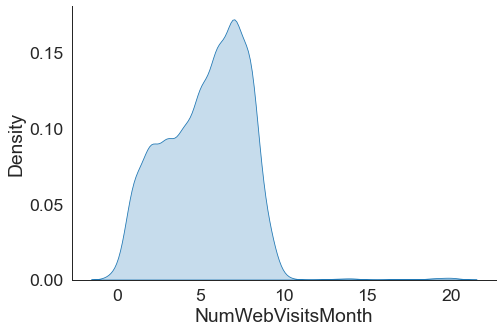

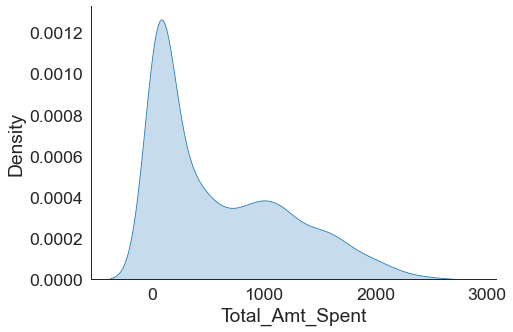

In [43]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)

cols = ['Age','Income','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Total_Amt_Spent']

for chosen_col in cols:
    sns.displot(data=marketing_data, x=chosen_col, kind="kde", aspect = 1.5, fill = True)

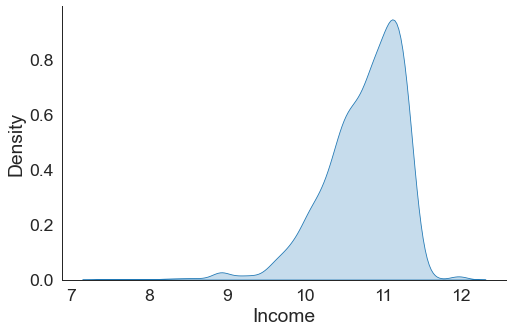

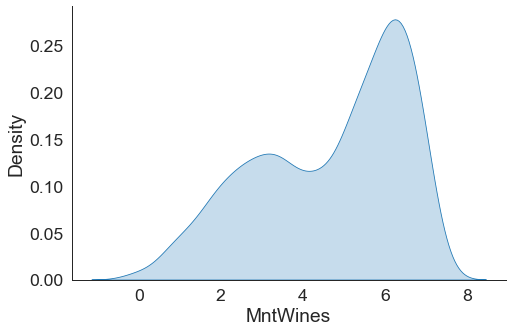

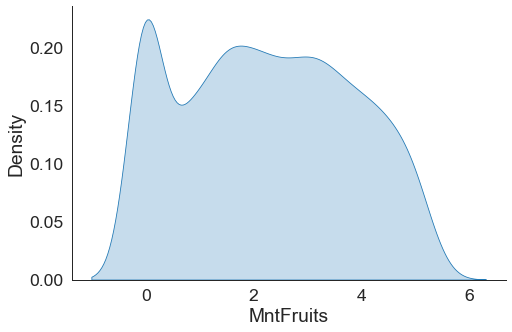

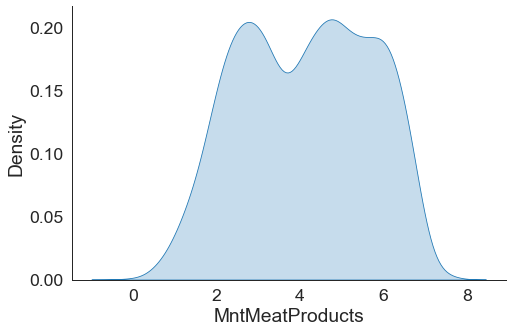

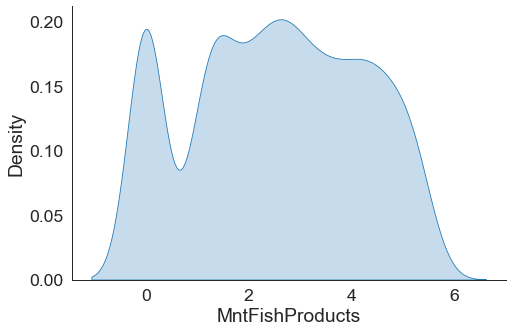

...

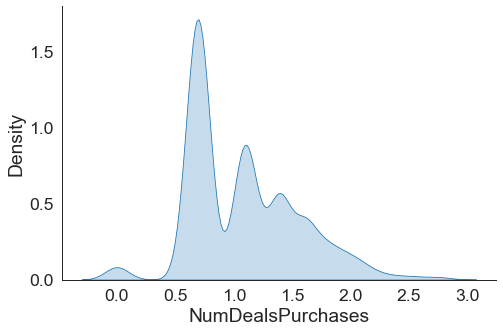

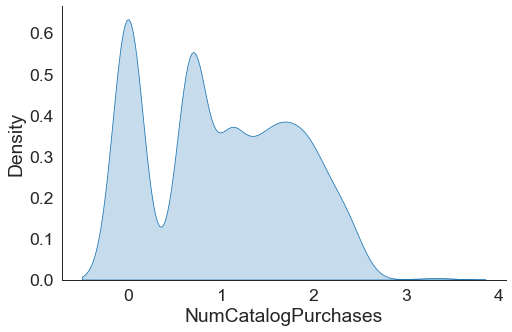

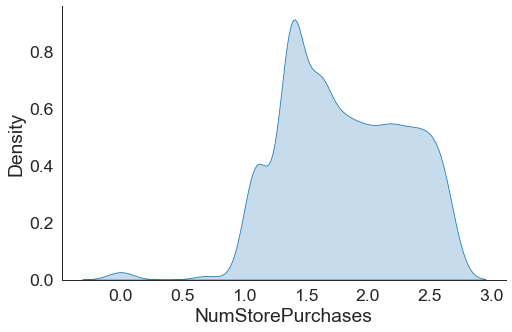

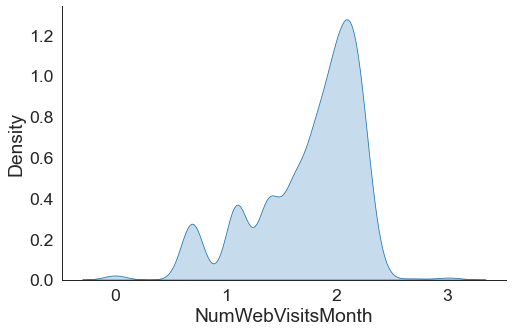

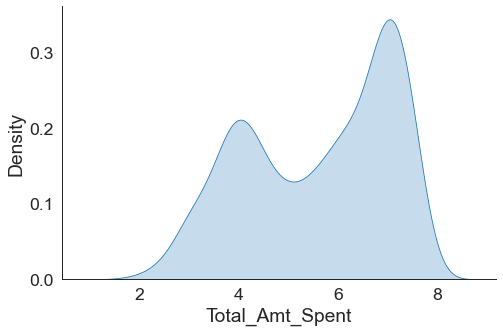

In [44]:
cols = ['Income','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Total_Amt_Spent']

for chosen_col in cols:
    enc_marketing_data[chosen_col] = np.log(enc_marketing_data[chosen_col] + 1)
    sns.displot(data=enc_marketing_data, x=chosen_col, kind="kde", aspect = 1.5, fill = True)


In [45]:
marketing_data.head()

,ID,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Overall_Acceptance_Rate,Membership_Duration,Total_Amt_Spent,Total_People
0,5524,66,Graduate,Single,58138.0,0,0,2012-09-04,58,635.0,88.0,546.0,172.0,88.0,88.0,3,8,10,4,7,0,0,0,0,0,0,1,0,10,1617.0,1
1,2174,69,Graduate,Single,46344.0,1,1,2014-03-08,38,11.0,1.0,6.0,2.0,1.0,6.0,2,1,1,2,5,0,0,0,0,0,0,0,0,9,27.0,3
2,4141,58,Graduate,Couple,71613.0,0,0,2013-08-21,26,426.0,49.0,127.0,111.0,21.0,42.0,1,8,2,10,4,0,0,0,0,0,0,0,0,9,776.0,2
3,6182,39,Graduate,Couple,26646.0,1,0,2014-02-10,26,11.0,4.0,20.0,10.0,3.0,5.0,2,2,0,4,6,0,0,0,0,0,0,0,0,9,53.0,3
4,5324,42,Post-Graduate,Couple,58293.0,1,0,2014-01-19,94,173.0,43.0,118.0,46.0,27.0,15.0,5,5,3,6,5,0,0,0,0,0,0,0,0,9,422.0,3


In [46]:
enc_marketing_data.head()

,ID,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Overall_Acceptance_Rate,Membership_Duration,Total_Amt_Spent,Total_People
0,5524,66,0,1,10.970592,0,0,2012-09-04,58,6.455199,4.488636,6.304449,5.153292,4.488636,4.488636,1.386294,8,2.397895,1.609438,2.079442,0,0,0,0,0,0,1,0,10,7.388946,1
1,2174,69,0,1,10.743869,1,1,2014-03-08,38,2.484907,0.693147,1.945910,1.098612,0.693147,1.945910,1.098612,1,0.693147,1.098612,1.791759,0,0,0,0,0,0,0,0,9,3.332205,3
2,4141,58,0,0,11.179046,0,0,2013-08-21,26,6.056784,3.912023,4.852030,4.718499,3.091042,3.761200,0.693147,8,1.098612,2.397895,1.609438,0,0,0,0,0,0,0,0,9,6.655440,2
3,6182,39,0,0,10.190432,1,0,2014-02-10,26,2.484907,1.609438,3.044522,2.397895,1.386294,1.791759,1.098612,2,0.000000,1.609438,1.945910,0,0,0,0,0,0,0,0,9,3.988984,3
4,5324,42,2,0,10.973254,1,0,2014-01-19,94,5.159055,3.784190,4.779123,3.850148,3.332205,2.772589,1.791759,5,1.386294,1.945910,1.791759,0,0,0,0,0,0,0,0,9,6.047372,3


# Feature Selection

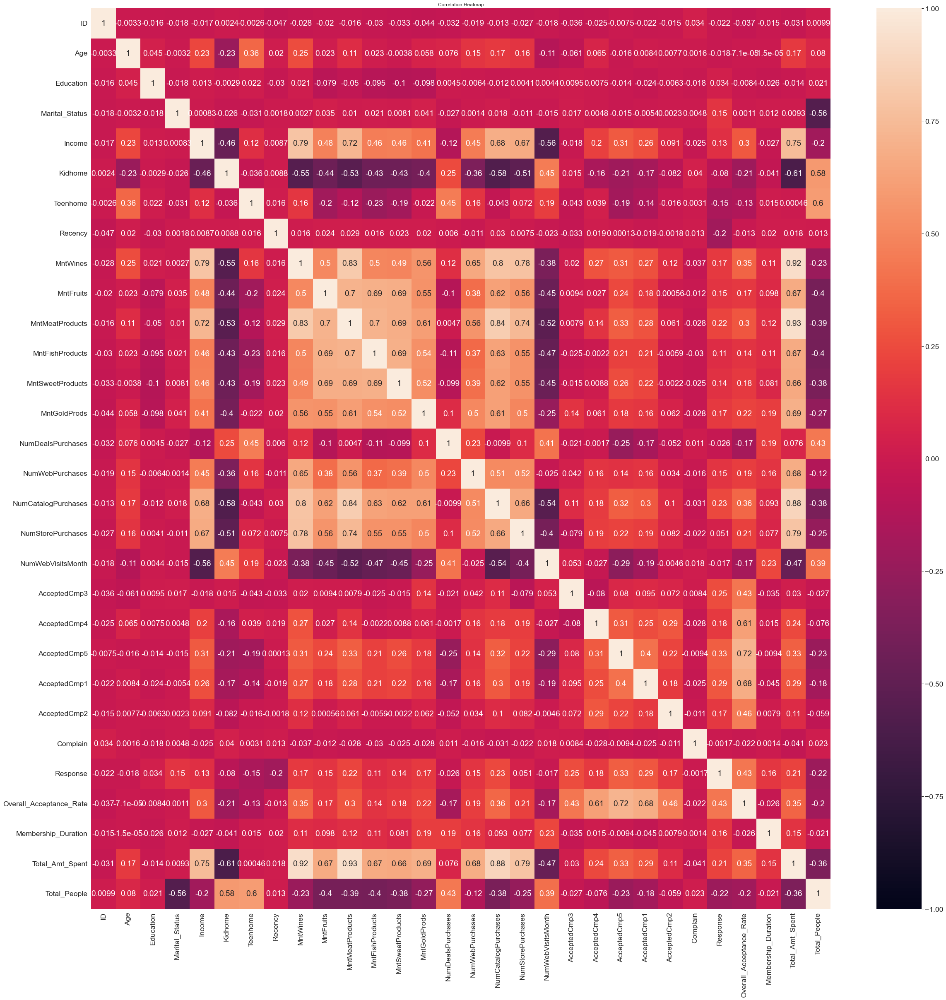

In [47]:
# Correlation matrix
plt.figure(figsize=(40, 40))
heatmap = sns.heatmap(enc_marketing_data.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12});

In [48]:
cols_to_remove = ['ID', 'Dt_Customer']
enc_marketing_data.drop(cols_to_remove, axis=1, inplace=True)

In [49]:
enc_marketing_data[enc_marketing_data.columns[1:]].corr()['Response'][:]

Education                  0.033564
Marital_Status             0.152398
Income                     0.128119
Kidhome                   -0.080008
Teenhome                  -0.154446
Recency                   -0.198437
MntWines                   0.174410
MntFruits                  0.148634
MntMeatProducts            0.222175
MntFishProducts            0.112779
MntSweetProducts           0.135565
MntGoldProds               0.173765
NumDealsPurchases         -0.025636
NumWebPurchases            0.148730
NumCatalogPurchases        0.234436
NumStorePurchases          0.051238
NumWebVisitsMonth         -0.016577
AcceptedCmp3               0.254258
AcceptedCmp4               0.177019
AcceptedCmp5               0.326634
AcceptedCmp1               0.293982
AcceptedCmp2               0.169293
Complain                  -0.001707
Response                   1.000000
Overall_Acceptance_Rate    0.426035
Membership_Duration        0.159832
Total_Amt_Spent            0.213548
Total_People              -0

In [50]:
#Will not bring additional information (or just very few), but will increase the complexity of the algorithm, thus increasing the risk of errors.
cols_to_remove = ['Complain','Overall_Acceptance_Rate']
enc_marketing_data.drop(cols_to_remove, axis=1, inplace=True)
enc_marketing_data.shape

(2240, 27)

# Data Visualisation

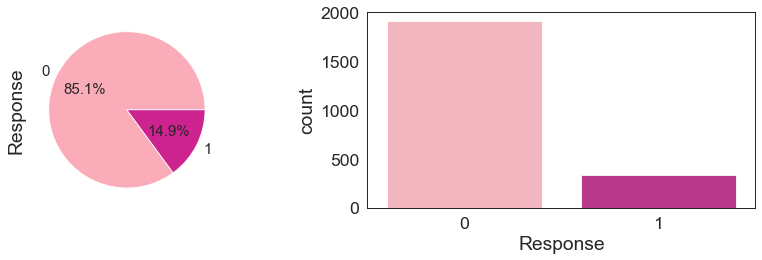

In [51]:
fig= plt.figure(figsize=(12,4))
fig.add_subplot(1,2,1)
palette_color_target = sns.color_palette("RdPu", 2)
a= marketing_data['Response'].value_counts(normalize=True).plot.pie(colors = palette_color_target,autopct='%1.1f%%',fontsize = 15)
fig.add_subplot(1,2,2)
sns.set_palette(palette_color_target)
responsechart=sns.countplot(x=marketing_data['Response'])
plt.tight_layout()
plt.show()

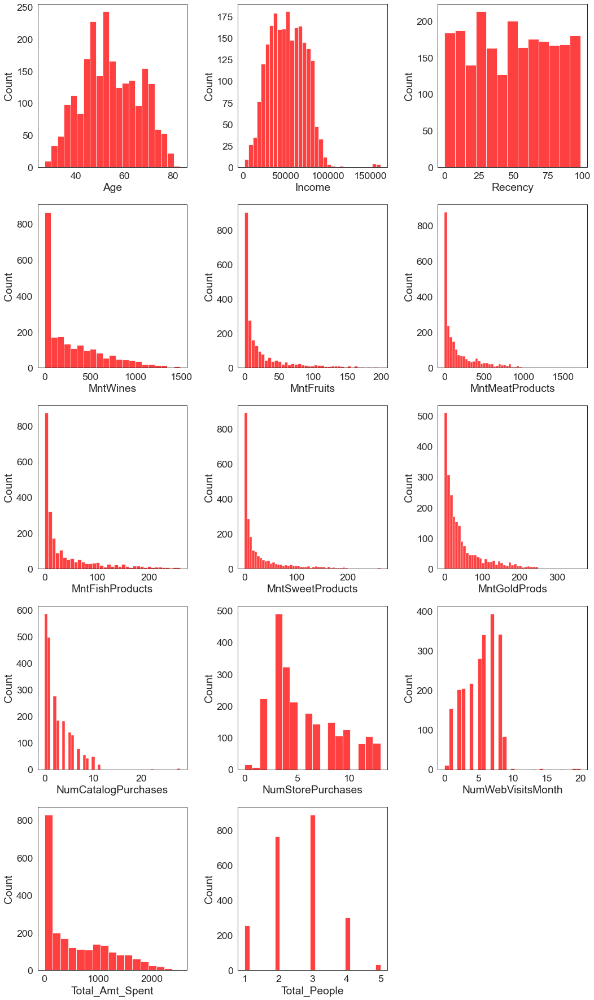

In [52]:
cols = 3
rows = 5
num_cols = ['Age','Income','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Total_Amt_Spent','Total_People']

fig = plt.figure(figsize=(cols*5, rows*5))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows,cols,i+1)
    
    sns.histplot(x = marketing_data[col], ax = ax, color = 'red')
    
fig.tight_layout()  
plt.show()

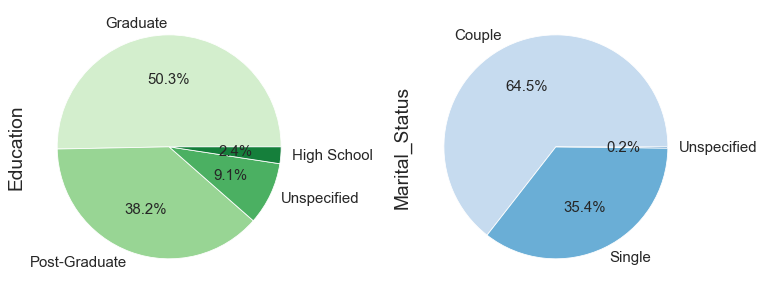

In [53]:
fig= plt.figure(figsize=(11,15))
fig.add_subplot(1,2,1)
palette_color_target = sns.color_palette("Greens", 4)
a= marketing_data['Education'].value_counts(normalize=True).plot.pie(colors = palette_color_target,autopct='%1.1f%%',fontsize = 15)

fig.add_subplot(1,2,2)
palette_color_target = sns.color_palette("Blues", 3)
a= marketing_data['Marital_Status'].value_counts(normalize=True).plot.pie(colors = palette_color_target,autopct='%1.1f%%',fontsize = 15)

plt.tight_layout()
plt.show()

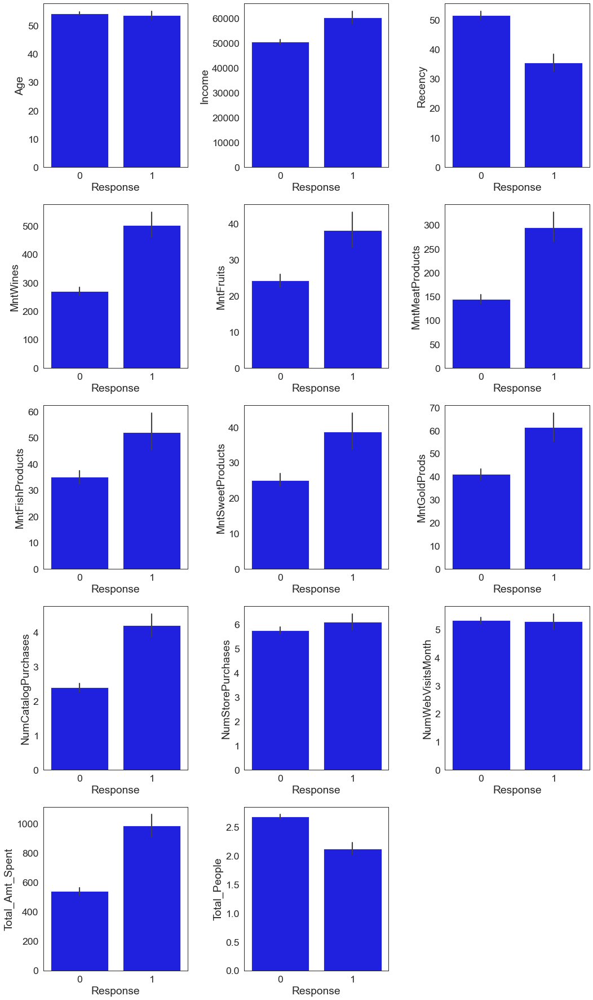

In [54]:
cols = 3
rows = 5
num_cols = ['Age','Income','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Total_Amt_Spent','Total_People']

fig = plt.figure(figsize=(cols*5, rows*5))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows,cols,i+1)
    
    sns.barplot(x=marketing_data['Response'], y = marketing_data[col], ax = ax, color = 'blue')
    
fig.tight_layout()  
plt.show()


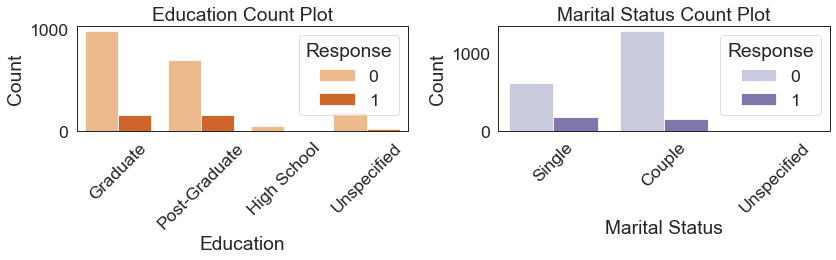

In [55]:
fig= plt.figure(figsize=(12,4))
fig.add_subplot(1,2,1)
palette_color = sns.color_palette('Oranges', 2)
sns.set_palette(palette_color)
sns.countplot(x='Education', hue='Response', data=marketing_data)
plt.xticks(rotation=45)
plt.title("Education Count Plot")
plt.xlabel("Education")
plt.ylabel("Count")

fig.add_subplot(1,2,2)
palette_color = sns.color_palette('Purples', 2)
sns.set_palette(palette_color)
sns.countplot(x='Marital_Status', hue='Response', data=marketing_data)
plt.xticks(rotation=45)
plt.title("Marital Status Count Plot")
plt.xlabel("Marital Status")
plt.ylabel("Count")

plt.tight_layout()
plt.show()